In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import csv
import math
import numpy as np
import pandas as pd
import scipy as sp
import sklearn as sl
from scipy import stats
from sklearn import datasets
from sklearn import linear_model
from sklearn import svm

In [2]:
#features = csv.reader(open('features4Moments.csv', newline=''), delimiter=',')
features = csv.reader(open('features.csv', newline=''), delimiter=',')
dataset = list(features)

for i in range(len(dataset)):
    dataset[i] = [float(x) for x in dataset[i]]
    
dataset = np.asarray(dataset)

In [3]:
seed = 1191647
np.random.seed(seed)

print(dataset.shape)

#Y = dataset[:,0]      # labels
#X = dataset[:,1:]

Y = dataset[0:86578,0]      # labels only for FB and TW 86578 for features.csv
X = dataset[0:86578,1:]
print(Y[:])

print(Y.shape)
print(X.shape)

#let's sort our data
permutation = np.random.permutation(X.shape[0])

X_new = X[permutation]
Y_new = Y[permutation]



(252151, 3)
[0. 0. 0. ... 1. 1. 1.]
(86578,)
(86578, 2)


In [4]:
m_training = math.ceil(Y.shape[0]*0.8)

Y_train, Y_test = Y_new[:m_training], Y_new[m_training:]
X_train, X_test = X_new[:m_training], X_new[m_training:]

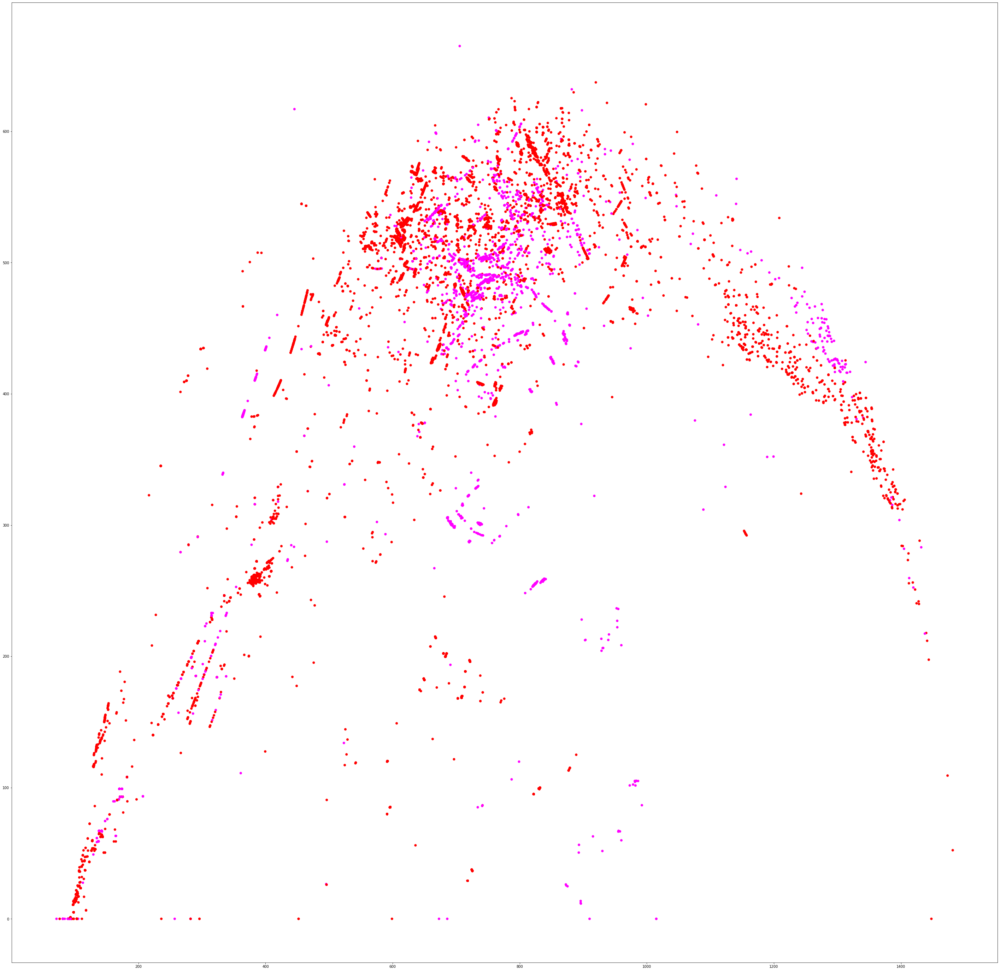

In [5]:
import matplotlib.pyplot as plt
import matplotlib.colors
import pandas as pd

colors = ['red','green','blue','purple', 'brown', 'cyan', 'magenta']

#valid if more than 2 features
fig = plt.figure(figsize=(50,50))
plt.scatter(X_train[:,0], X_train[:,1], c=Y_train, cmap=matplotlib.colors.ListedColormap(colors))


In [6]:
clf = svm.SVC(decision_function_shape='ovr', kernel= 'rbf' , C = 8, gamma=0.1)
clf.fit(X_train, Y_train).score(X_train, Y_train)
#from sklearn.model_selection import GridSearchCV
#from sklearn import svm
#params_svm = {
#    'kernel' : ['rbf'],  
#    'C' : [8],             
#    'gamma' : [0.1]      
#}
#svm_clf = svm.SVC()
#estimator_svm = GridSearchCV(svm_clf,param_grid=params_svm,cv=2,verbose=1,scoring='accuracy')
#estimator_svm.fit(X_train,Y_train)
#print(estimator_svm.best_params_)
#estimator_svm.best_score_

Fitting 2 folds for each of 1 candidates, totalling 2 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  5.1min finished


In [10]:
import joblib
# save
joblib.dump(estimator_svm, "model_svm.pkl") 


['model_svm.pkl']

In [11]:
pred_cls = estimator_svm.predict(X_test[1:])
#how many wrong in test set?
wrong= 0
for i in range(0, Y_test.shape[0]-1):
    if Y_test[i] != pred_cls[i]:
        wrong = wrong + 1
print('total wrong: '+ str(wrong))
perc = wrong/len(Y_test)
print(perc)


NotFittedError: This GridSearchCV instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.